# Face Similarity using Eigenfaces on the Totally Looks Like dataset that was cleaned and prepared specifically for facial similarity.

## Normally the dataset contains two folders (left and right; image a in left is similar to image a in right) but we decided to add another folder wich combine both folders and leave the similar images next to each other.


## Here is the roadmap for this technique
## from https://towardsdatascience.com/an-attempt-to-fine-tune-facial-recognition-eigenfaces-a6baa8fc0e62
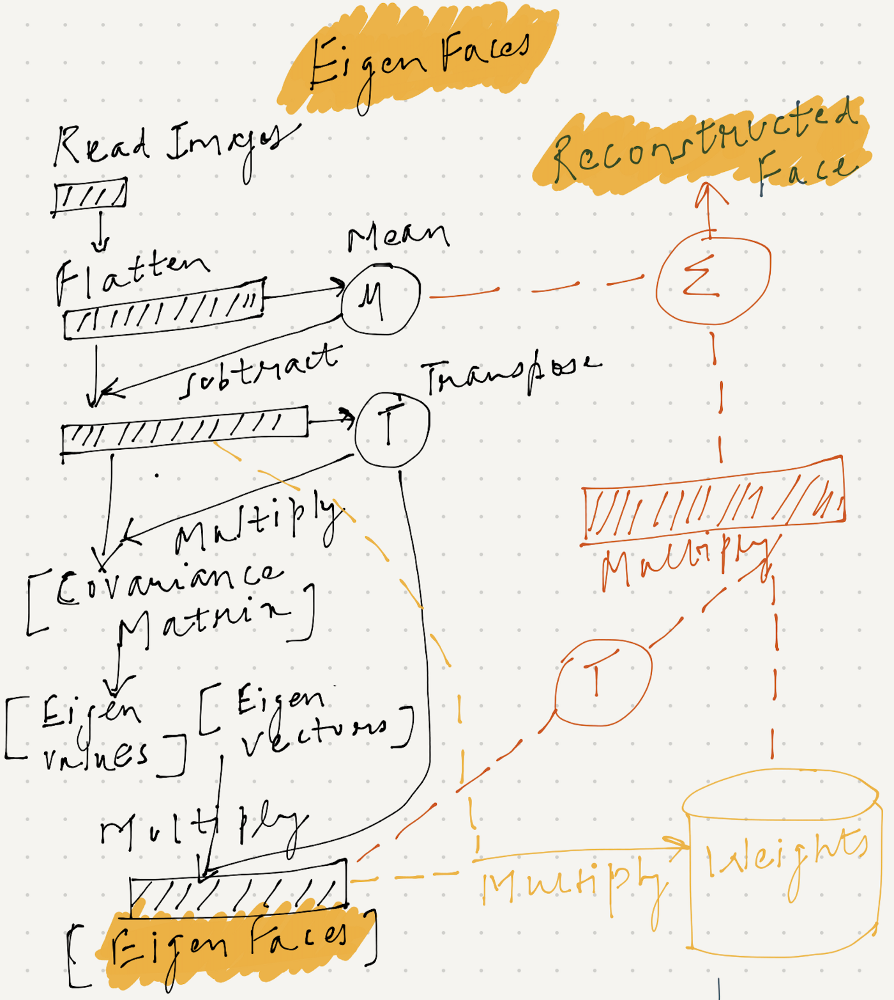

In [1]:
import scipy.io
import numpy as np


from datetime import datetime, timedelta
import time

import tensorflow as tf


import keras 
from keras.preprocessing import image
from sklearn.decomposition import PCA 

from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.layers import Dense, Activation, Dropout, Flatten, Input, Convolution2D, ZeroPadding2D, MaxPooling2D, Activation
from keras.layers import Conv2D, AveragePooling2D
from keras.models import Model, Sequential
from keras import metrics
from keras.models import model_from_json


from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
from keras.applications.imagenet_utils import preprocess_input
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
import cv2
from scipy.spatial import distance
import pandas as pd

In [2]:

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import tensorflow as tf
from keras import backend as K

In [3]:

#open-cv's face detection module
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [4]:
p=PCA()

In [5]:
import os
from pathlib import Path
#Change directory to root
path = Path(os.getcwd())
root_dir = path.parent.absolute()
os.chdir(str(root_dir))

In [6]:
#Get all the images names in a list 
r="/data/combined"
mypath=str(root_dir)+r
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
onlyfiles

['00003 (2).jpg',
 '00003.jpg',
 '00010 (2).jpg',
 '00010.jpg',
 '00016 (2).jpg',
 '00016.jpg',
 '00018 (2).jpg',
 '00018.jpg',
 '00020 (2).jpg',
 '00020.jpg',
 '00022 (2).jpg',
 '00022.jpg',
 '00025 (2).jpg',
 '00025.jpg',
 '00030 (2).jpg',
 '00030.jpg',
 '00035 (2).jpg',
 '00035.jpg',
 '00042 (2).jpg',
 '00042.jpg',
 '00047 (2).jpg',
 '00047.jpg',
 '00051 (2).jpg',
 '00051.jpg',
 '00062 (2).jpg',
 '00062.jpg',
 '00066 (2).jpg',
 '00066.jpg',
 '00068 (2).jpg',
 '00068.jpg',
 '00070 (2).jpg',
 '00070.jpg',
 '00072 (2).jpg',
 '00072.jpg',
 '00074 (2).jpg',
 '00074.jpg',
 '00075 (2).jpg',
 '00075.jpg',
 '00076 (2).jpg',
 '00076.jpg',
 '00080 (2).jpg',
 '00080.jpg',
 '00083 (2).jpg',
 '00083.jpg',
 '00087 (2).jpg',
 '00087.jpg',
 '00088 (2).jpg',
 '00088.jpg',
 '00089 (2).jpg',
 '00089.jpg',
 '00099 (2).jpg',
 '00099.jpg',
 '00101 (2).jpg',
 '00101.jpg',
 '00103 (2).jpg',
 '00103.jpg',
 '00104 (2).jpg',
 '00104.jpg',
 '00105 (2).jpg',
 '00105.jpg',
 '00130 (2).jpg',
 '00130.jpg',
 '00138 

In [7]:
#empty dataframe where we can store all the paths
d = pd.DataFrame()
d['path'] = onlyfiles
d.shape

(1600, 1)

In [8]:
#Extraction of the faces of all images
def preprocess(image_path):
    r="/data/combined/"
    r=str(root_dir)+r
   
    try:
        img = cv2.imread(r+image_path)
        faces = face_cascade.detectMultiScale(img, 1.3, 5)
        for (x,y,w,h) in faces:
            img = img[int(y):int(y+h), int(x):int(x+w)]
        detected_face = cv2.resize(img, (224, 224))
    except: 
        detected_face= None
    
    #img = img_to_array(detected_face)
    #img = np.expand_dims(img, axis=0)
   # img =preprocess_input(img)
   
    return detected_face


In [9]:
d['pixels'] = d['path'].apply(preprocess)


In [10]:
d

,path,pixels
0,00003 (2).jpg,"[[[114, 120, 115], [119, 125, 120], [121, 127,..."
1,00003.jpg,"[[[23, 26, 26], [7, 9, 9], [18, 20, 20], [14, ..."
2,00010 (2).jpg,"[[[173, 174, 172], [166, 167, 165], [145, 146,..."
3,00010.jpg,"[[[42, 51, 55], [42, 51, 55], [43, 52, 55], [4..."
4,00016 (2).jpg,"[[[88, 98, 108], [74, 85, 95], [46, 57, 68], [..."
...,...,...
1595,06005.jpg,"[[[15, 23, 30], [13, 21, 28], [11, 18, 26], [8..."
1596,07182 (2).jpg,"[[[55, 55, 55], [55, 55, 55], [55, 55, 55], [5..."
1597,07182.jpg,"[[[31, 36, 39], [30, 35, 38], [28, 34, 37], [2..."
1598,07183 (2).jpg,"[[[30, 30, 30], [29, 29, 29], [34, 34, 34], [3..."


In [11]:
v=d[d['pixels'].isna()]
v

,path,pixels


In [12]:
#making all images in gray level
def Gray(img):
    
    r="/data/combined/"
    r=str(root_dir)+r
    img = cv2.imread(r+img)
    try: 
        #detected_face = cv2.resize(detected_face, (224, 224))
        

       
        detected_face=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(detected_face, 1.3, 5)
        for (x,y,w,h) in faces:
            detected_face = detected_face[int(y):int(y+h), int(x):int(x+w)]
        detected_face = cv2.resize(detected_face, (224, 224))
        
    except : 
        detected_face= None
        
    return detected_face


In [13]:
d['Gray']=d['path'].apply(lambda x: Gray(x))

In [14]:
d[['Gray']]


,Gray
0,"[[118, 123, 125, 125, 121, 111, 102, 111, 114,..."
1,"[[26, 9, 20, 16, 11, 12, 14, 12, 10, 10, 11, 1..."
2,"[[173, 166, 145, 124, 103, 81, 64, 49, 35, 24,..."
3,"[[51, 51, 52, 52, 53, 55, 56, 56, 56, 55, 54, ..."
4,"[[100, 87, 59, 48, 57, 64, 69, 68, 55, 43, 34,..."
...,...
1595,"[[24, 22, 20, 17, 14, 14, 15, 19, 24, 29, 33, ..."
1596,"[[55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, ..."
1597,"[[36, 35, 34, 32, 31, 31, 30, 31, 33, 30, 27, ..."
1598,"[[30, 29, 34, 38, 47, 42, 32, 21, 13, 15, 24, ..."


In [15]:
#Making all images flat
def Flatten(img):
    f=[]
    
    detected_face=img
        
    f.append(np.reshape(detected_face,(224 * 224)))
        
        
    
    
    f=np.asmatrix(f)
    return f


In [16]:
f=d['Gray'].apply(lambda  x: Flatten(x))

In [17]:
f



0       [[[[[118 123 125 ...  33  32  36]]]]]
1       [[[[[ 26   9  20 ... 169 121 117]]]]]
2       [[[[[173 166 145 ...  26  24  23]]]]]
3       [[[[[ 51  51  52 ... 166 142 133]]]]]
4       [[[[[100  87  59 ...  46  49  50]]]]]
                        ...                  
1595    [[[[[ 24  22  20 ... 229 229 229]]]]]
1596          [[[[[55 55 55 ... 54 53 53]]]]]
1597          [[[[[36 35 34 ... 70 69 68]]]]]
1598          [[[[[30 29 34 ... 27 27 27]]]]]
1599    [[[[[174 175 176 ... 185  73  13]]]]]
Name: Gray, Length: 1600, dtype: object

In [18]:
#np.save('flattengray.npy',f)

In [19]:
#f=np.load('flattengray.npy')

In [20]:
#storing the flattened images in one matrix
a=[]

for i in range(1600):
    
    
    try:
        a.append(f[i])
        
   
    except KeyError as key:
        i=i+1
   

In [21]:
a

[matrix([[118, 123, 125, ...,  33,  32,  36]], dtype=uint8),
 matrix([[ 26,   9,  20, ..., 169, 121, 117]], dtype=uint8),
 matrix([[173, 166, 145, ...,  26,  24,  23]], dtype=uint8),
 matrix([[ 51,  51,  52, ..., 166, 142, 133]], dtype=uint8),
 matrix([[100,  87,  59, ...,  46,  49,  50]], dtype=uint8),
 matrix([[  0,   0,   0, ..., 194, 197, 199]], dtype=uint8),
 matrix([[ 60,  53,  43, ..., 236, 239, 241]], dtype=uint8),
 matrix([[51, 62, 76, ...,  8, 11, 13]], dtype=uint8),
 matrix([[115, 115, 116, ..., 205, 196, 192]], dtype=uint8),
 matrix([[ 13,  13,  12, ..., 203, 203, 203]], dtype=uint8),
 matrix([[161, 160, 158, ...,  24,  38,  52]], dtype=uint8),
 matrix([[237, 235, 234, ...,  39,  43,  46]], dtype=uint8),
 matrix([[233, 232, 227, ...,   8,   9,   9]], dtype=uint8),
 matrix([[68, 69, 77, ..., 41, 43, 43]], dtype=uint8),
 matrix([[ 39,  40,  43, ...,  90, 118, 134]], dtype=uint8),
 matrix([[127, 127, 127, ...,  44,  44,  44]], dtype=uint8),
 matrix([[ 65,  69,  70, ..., 178, 1

(<AxesSubplot:title={'center':'Mean face'}>,
 (-0.5, 223.5, 223.5, -0.5),
 Text(0.5, 1.0, 'Mean face'))

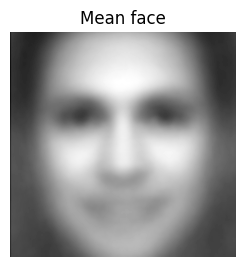

In [22]:
#computing the mean face and visualizing it.
mean_face = np.mean(a, axis=0)
plt.subplot(121), plt.imshow(np.reshape(mean_face, (224,224)), cmap="gray"), plt.axis('off'), plt.title('Mean face')

In [23]:

a=np.asarray(a)
a=np.asmatrix(a)

In [24]:
# Subtract average_face_vector from every image vector.
px_images = np.zeros(a.shape)
px_images = a - mean_face
px_images.shape

(1600, 50176)

In [25]:
px_images.T.shape

(50176, 1600)

In [26]:
#computing the covariance matrix
covariance_matrix = np.dot(px_images, px_images.T)
covariance_matrix.shape


(1600, 1600)

In [27]:
#Eigenvalues and eigenvectors
val, vec = np.linalg.eigh(covariance_matrix)
# val is the eigenvalue, vec is the eigenvector
prod = np.dot(px_images.T, vec)
prod

matrix([[ 1.89010655e-09, -3.34789974e-11, -2.06312748e-02, ...,
          3.84272133e+02,  1.98623385e+02, -1.07345688e+03],
        [-7.25542743e-09,  1.03907549e-10, -3.08839785e-02, ...,
          3.94809039e+02,  2.91542221e+02, -1.06064815e+03],
        [-4.24119823e-10,  3.96882527e-12, -3.44930910e-02, ...,
          4.11288548e+02,  2.60237807e+02, -1.05257317e+03],
        ...,
        [-1.07714441e-10,  2.42561526e-12,  1.56422695e-02, ...,
         -4.33847186e+02,  7.68617786e+02, -1.12381079e+03],
        [ 1.08123799e-10,  4.10560475e-12, -3.46241028e-03, ...,
         -4.30132450e+02,  7.61097987e+02, -1.11162465e+03],
        [ 1.19279181e-10,  7.34912131e-12, -4.49055853e-03, ...,
         -4.22428043e+02,  7.37348971e+02, -1.10284845e+03]])

In [28]:
#we sort the prod matrix depending on the eigenvalues
idx = np . argsort ( - val )
val = val [ idx ]
prod = prod [: , idx ]
prod

matrix([[-1.07345688e+03,  1.98623385e+02,  3.84272133e+02, ...,
         -2.06312748e-02, -3.34789974e-11,  1.89010655e-09],
        [-1.06064815e+03,  2.91542221e+02,  3.94809039e+02, ...,
         -3.08839785e-02,  1.03907549e-10, -7.25542743e-09],
        [-1.05257317e+03,  2.60237807e+02,  4.11288548e+02, ...,
         -3.44930910e-02,  3.96882527e-12, -4.24119823e-10],
        ...,
        [-1.12381079e+03,  7.68617786e+02, -4.33847186e+02, ...,
          1.56422695e-02,  2.42561526e-12, -1.07714441e-10],
        [-1.11162465e+03,  7.61097987e+02, -4.30132450e+02, ...,
         -3.46241028e-03,  4.10560475e-12,  1.08123799e-10],
        [-1.10284845e+03,  7.37348971e+02, -4.22428043e+02, ...,
         -4.49055853e-03,  7.34912131e-12,  1.19279181e-10]])

In [29]:
#Normalization of the values
for i in range(len(a)):
    prod[:,i] = prod[:,i]/np.linalg.norm(prod[:,i])
prod


matrix([[-0.00464321,  0.00111226,  0.00248891, ..., -0.00113165,
         -0.02025045,  0.01120011],
        [-0.00458781,  0.00163259,  0.00255715, ..., -0.00169403,
          0.06285058, -0.04299312],
        [-0.00455288,  0.00145729,  0.00266389, ..., -0.00189199,
          0.00240062, -0.00251319],
        ...,
        [-0.00486102,  0.00430413, -0.00281   , ...,  0.000858  ,
          0.00146718, -0.00063828],
        [-0.0048083 ,  0.00426202, -0.00278594, ..., -0.00018992,
          0.00248336,  0.0006407 ],
        [-0.00477034,  0.00412903, -0.00273604, ..., -0.00024631,
          0.00444526,  0.00070681]])

## We obtain the eigenfaces of our dataset.

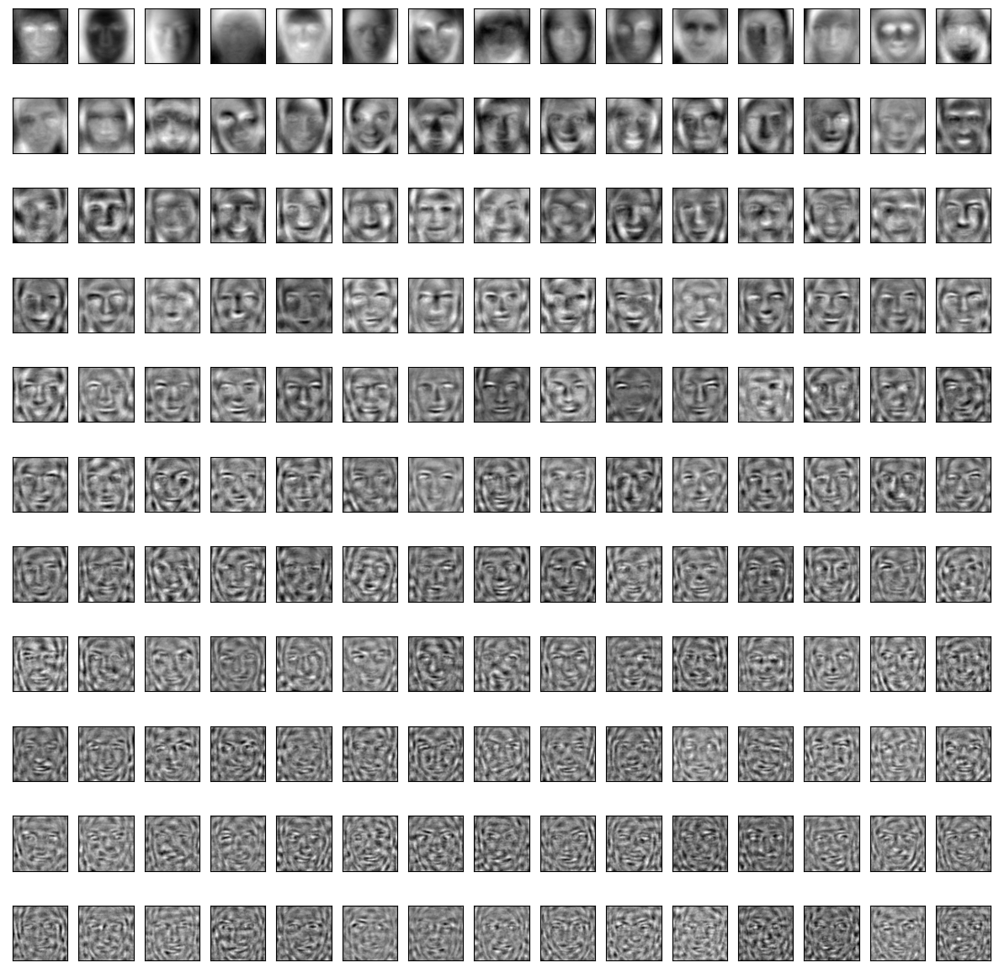

In [30]:
def show_EigenVecs():
    fig, axes = plt.subplots(11, 15, figsize=(15, 15), subplot_kw={'xticks':[], 'yticks':[]})
    for i, ax in enumerate(axes.flat):
        ax.imshow(np.reshape(np.array(prod)[:,i], (224,224)), cmap = 'gray')
show_EigenVecs()

In [31]:
#weights = np.dot(px_images, prod)
#np.save("weights.npy",weights)

In [32]:
#the previous cell indicates how to compute the weights and now we load them to gain time.
mypath=str(root_dir)+'/numpy/Eigenface/'
weights=np.load(mypath + "weights.npy")
weights.shape

(1600, 1600)

In [33]:
#reconstructed_flattened_image_vector = mean_face + np.dot(weights, prod.T)
#np.save("reconstructed.npy",reconstructed_flattened_image_vector)

In [34]:
#Download and put them inside the numpy Eigenfaces folder
#https://drive.google.com/file/d/1j7p3dAvIWoR4t7E4PTrBh_knS1-brC2H/view?usp=sharing
#Same for the reconstructed faces.
mypath=str(root_dir)+'/numpy/Eigenface/'
reconstructed_flattened_image_vector=np.load(mypath + "reconstructed.npy")
reconstructed_flattened_image_vector.shape

(1600, 50176)

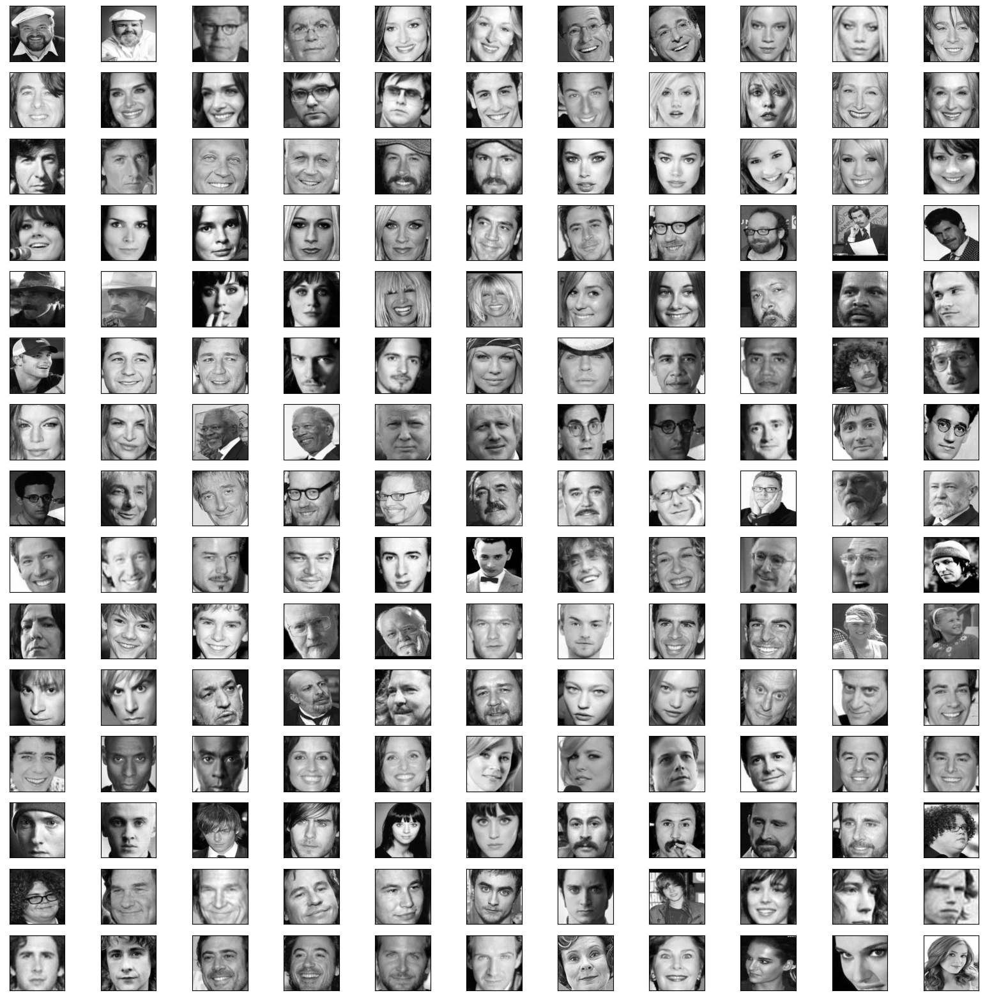

In [35]:
#We can reconstruct the visages from the eigenfaces.
def show_reconstructed_images(pixels):
    fig, axes = plt.subplots(15, 11, figsize=(20, 20), subplot_kw={'xticks':[], 'yticks':[]})
    for i, ax in enumerate(axes.flat):
        ax.imshow(np.reshape(np.array(pixels)[i], (224,224)) , cmap='gray')
    plt.show()
show_reconstructed_images(reconstructed_flattened_image_vector)

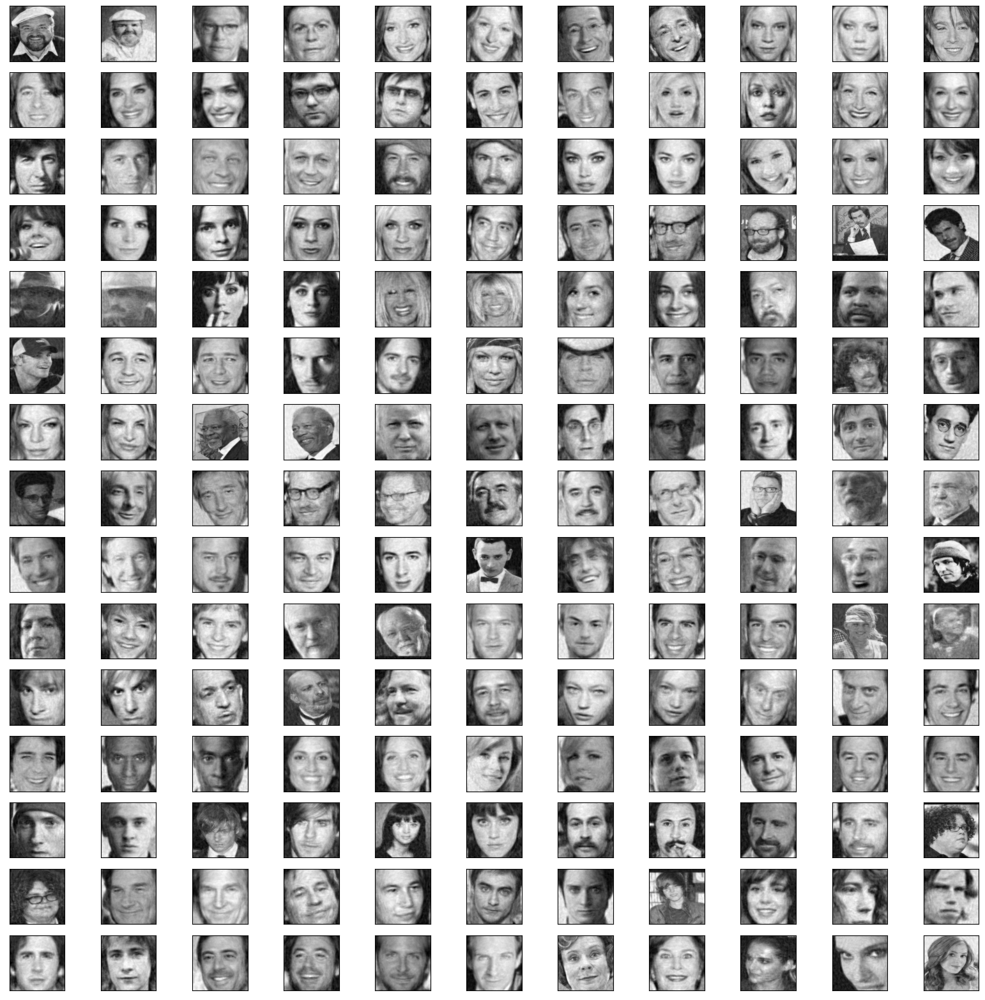

In [36]:
#We can also reconstruct the faces from only 25% of the dimensions.
K = 400
selected_eigenVectors = prod[:, 0:K]
selected_weights = np.dot(px_images, selected_eigenVectors)
reconstructed_flattened_image_vector_k = mean_face + np.dot(selected_weights, selected_eigenVectors.T)
show_reconstructed_images(reconstructed_flattened_image_vector_k)

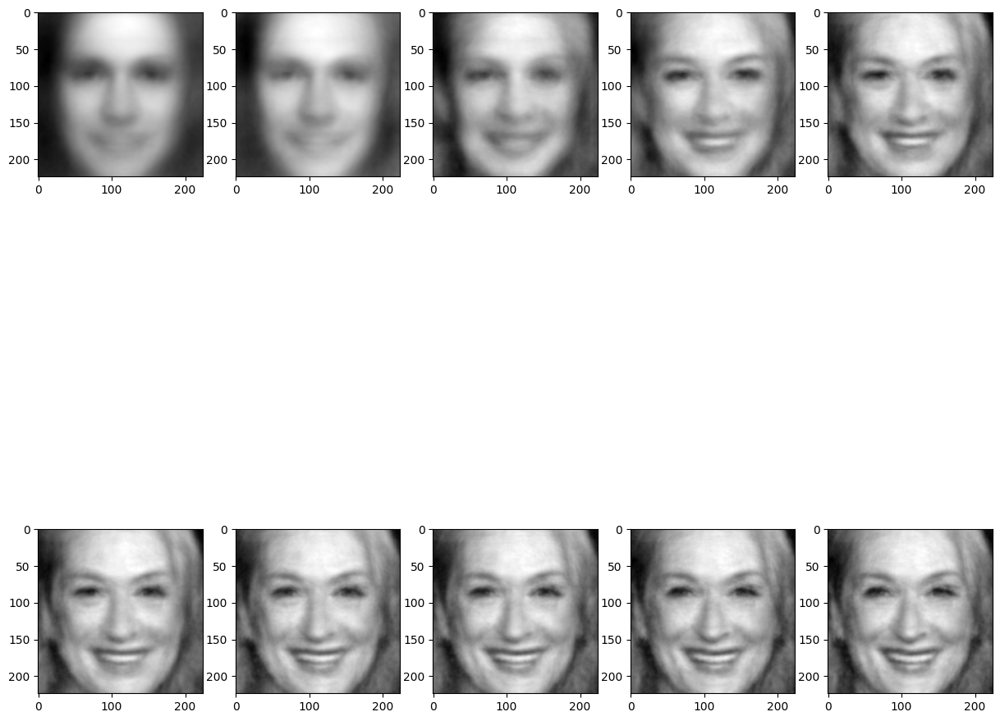

In [37]:
#25% is the threshold for getting good visages in reconstruction.
def reconstruction_progress(k):
    selected_eigenVectors = prod[:, 0:k]
    selected_weights = np.dot(px_images, selected_eigenVectors)
    reconstructed_flattened_image_vector_k = mean_face + np.dot(selected_weights, selected_eigenVectors.T)
    return reconstructed_flattened_image_vector_k
K = [10, 20, 50, 100, 150, 200, 250, 300,350, 400]
E = []
for k in K:
    E.append(reconstruction_progress(k)[21])
    
def show_reconstructed_images_progress(pixels):
    fig, axes = plt.subplots(2, 5, figsize=(15, 15))
    for i, ax in enumerate(axes.flat):
        ax.imshow(np.reshape(np.array(pixels)[i], (224,224)) , cmap='gray')
show_reconstructed_images_progress(E)

In [38]:
weights

array([[ 1.98784089e+03, -1.43140158e+03,  3.67136378e+02, ...,
        -8.80259164e-04, -5.22843663e-02, -1.71045849e+01],
       [-1.12321233e+04,  7.15891580e+01, -5.16545033e+03, ...,
         6.46869160e-04,  2.99364130e+00, -3.11853970e+01],
       [ 2.73820646e+03,  9.47498205e+02, -7.56483735e+03, ...,
        -6.21530560e-03,  2.18039155e+00,  2.76351683e+02],
       ...,
       [-2.86049017e+03, -1.58375715e+03, -3.80567518e+03, ...,
         8.38131212e-04, -4.01088901e-02,  3.14178058e+01],
       [-4.60239326e+03, -4.20691616e+03, -2.35341532e+03, ...,
         1.10871132e-03,  2.29314164e-02,  1.23778222e+02],
       [-5.26738731e+03, -7.62612008e+02, -2.10167652e+03, ...,
        -1.36025272e-03, -7.59207133e-01,  4.11871228e+01]])

In [39]:
weights.shape

(1600, 1600)

In [40]:
reconstructed_flattened_image_vector_k.shape

(1600, 50176)

In [41]:
reconstructed_flattened_image_vector_k


matrix([[124.22681121, 130.09419193, 131.53513898, ...,  38.31777363,
          38.76431988,  47.00399883],
        [  0.84608494,  -6.415285  ,   4.52431001, ..., 140.6019177 ,
          95.17673579,  76.40375257],
        [145.25689381, 137.70327341, 125.44906125, ...,  27.08483788,
          23.53379758,  18.13930889],
        ...,
        [ 26.52846108,  24.52223026,  23.62646296, ...,  55.92612285,
          47.00932856,  40.34740602],
        [ 25.46815857,  27.24814792,  29.29971028, ...,  22.6440072 ,
          22.09400171,  21.26875222],
        [168.64815801, 167.7505076 , 168.311101  , ..., 127.29683189,
         110.72443835, 103.94174844]])

In [42]:
#np.save('reconstruct_k.npy',reconstructed_flattened_image_vector_k)

In [43]:
# Download and put them in the numpy Eigenfaces folder
#https://drive.google.com/file/d/1WZ0563duA6tpfnT8vHCHgXjTJMuIgafT/view?usp=sharing
mypath=str(root_dir)+'/numpy/Eigenface/'
r=np.load(mypath + 'reconstruct_k.npy')
r


array([[108.40418975, 113.95575088, 114.4368979 , ...,  42.88944344,
         43.1720681 ,  51.95099962],
       [-12.64211642, -14.603958  , -13.04808973, ..., 125.82327513,
         96.02651839,  74.22693815],
       [117.96756975, 114.26892577, 108.44280761, ...,  32.35475056,
         32.44325402,  34.1004839 ],
       ...,
       [ 27.50290977,  26.38392129,  26.62778524, ...,  81.34355347,
         75.18276318,  70.68883662],
       [ 37.90666504,  39.18602204,  38.87407086, ...,  25.79319657,
         29.35486094,  31.6424945 ],
       [180.07026271, 177.78249886, 174.95443693, ..., 115.54275567,
        107.91729505, 103.92838288]])

In [44]:
r.shape

(1600, 50176)

# Now after representing the faces we will measure the similarity using the cosine similarity and the euclidean distance.

In [45]:
def findCosineSimilarity(source_representation, test_representation):
    a = np.matmul(np.transpose(source_representation), test_representation)
    b = np.sum(np.multiply(source_representation, source_representation))
    c = np.sum(np.multiply(test_representation, test_representation))
    return 1 - (a / (np.sqrt(b) * np.sqrt(c)))

In [46]:
def findEuclideanDistance(source_representation, test_representation):
    euclidean_distance = source_representation - test_representation
    euclidean_distance = np.sum(np.multiply(euclidean_distance, euclidean_distance))
    euclidean_distance = np.sqrt(euclidean_distance)
    return euclidean_distance

In [47]:

def SimilarityEuc(representation, img1_representation):
   
    euclidean_distance = findEuclideanDistance(img1_representation, representation)
    return euclidean_distance


In [48]:
def SimilarityCos(representation, img1_representation):
    
    cosine_similarity = findCosineSimilarity(img1_representation, representation)
   
    return cosine_similarity


## We already did the calculations and to save time we will only be loading them.

In [49]:
'''
%%time
cos=np.zeros((1600,1600))
euc=np.zeros((1600,1600))
for i in range(1600):
    for j in range(1600):
        
        cos[i][j]=SimilarityCos(r[i],r[j])
        
        euc[i][j]=SimilarityEuc(r[i],r[j])
  '''      

'\n%%time\ncos=np.zeros((1600,1600))\neuc=np.zeros((1600,1600))\nfor i in range(1600):\n    for j in range(1600):\n        \n        cos[i][j]=SimilarityCos(r[i],r[j])\n        \n        euc[i][j]=SimilarityEuc(r[i],r[j])\n  '

In [50]:
'''
for i in range(1600):
    for j in range(1600):
        if(i==j):
            cos[i][j]=0.
cos
'''

'\nfor i in range(1600):\n    for j in range(1600):\n        if(i==j):\n            cos[i][j]=0.\ncos\n'

In [51]:
#np.save('combinedEigenCos.npy',cos)
#np.save('combinedEigenEuc.npy',euc)

In [52]:
mypath=str(root_dir)+'/numpy/Eigenface/'
cos=np.load(mypath + 'combinedEigenCos.npy')
cos

array([[0.        , 0.20083016, 0.21409196, ..., 0.12901449, 0.12127142,
        0.14095691],
       [0.20083016, 0.        , 0.12511581, ..., 0.07606169, 0.09323173,
        0.07464973],
       [0.21409196, 0.12511581, 0.        , ..., 0.09069009, 0.08440968,
        0.08407628],
       ...,
       [0.12901449, 0.07606169, 0.09069009, ..., 0.        , 0.02566579,
        0.03627655],
       [0.12127142, 0.09323173, 0.08440968, ..., 0.02566579, 0.        ,
        0.04337835],
       [0.14095691, 0.07464973, 0.08407628, ..., 0.03627655, 0.04337835,
        0.        ]])

In [53]:
mypath=str(root_dir)+'/numpy/Eigenface/'
euc=np.load(mypath + 'combinedEigenEuc.npy')
euc

array([[    0.        , 25202.7784982 , 18651.56835336, ...,
        15658.83052777, 16360.83977505, 17226.0333056 ],
       [25202.7784982 ,     0.        , 21957.70265382, ...,
        17188.08030391, 17795.36027515, 16408.54360979],
       [18651.56835336, 21957.70265382,     0.        , ...,
        13254.47953663, 14331.25924054, 13931.68276052],
       ...,
       [15658.83052777, 17188.08030391, 13254.47953663, ...,
            0.        ,  7891.72124943,  9009.78084889],
       [16360.83977505, 17795.36027515, 14331.25924054, ...,
         7891.72124943,     0.        , 10014.63601583],
       [17226.0333056 , 16408.54360979, 13931.68276052, ...,
         9009.78084889, 10014.63601583,     0.        ]])

## After measuring the similarity using both measures we will be sorting the matrix obtained based on the indexes and we will see for each face the top faces going from the top 1 till top 5.

## Bearing in mind that we have our dataset which will be comparing our results with.

In [54]:
argcos=cos.argsort(axis=1)
argcos

array([[   0, 1438, 1285, ...,   77, 1121, 1221],
       [   1, 1345,  436, ...,  697, 1221, 1239],
       [   2,  661,  272, ..., 1221,  453, 1239],
       ...,
       [1597,  260,  874, ..., 1239,  453, 1221],
       [1598,  650,  874, ...,  453, 1239, 1221],
       [1599, 1199,  420, ...,  453, 1239, 1221]], dtype=int64)

In [55]:
argeuc=euc.argsort(axis=1)
argeuc

array([[   0, 1285, 1438, ...,   85,  610,  696],
       [   1,  436,  275, ...,  697, 1239, 1221],
       [   2,  272,  467, ..., 1454,   85,  838],
       ...,
       [1597,  260,  874, ...,  696,  453, 1221],
       [1598,  650,  874, ...,  453, 1239, 1221],
       [1599, 1043,  727, ...,  453, 1239, 1221]], dtype=int64)

In [56]:
co=argcos[:,:2]
eu=argeuc[:,:2]

In [57]:
co

array([[   0, 1438],
       [   1, 1345],
       [   2,  661],
       ...,
       [1597,  260],
       [1598,  650],
       [1599, 1199]], dtype=int64)

In [58]:
eu

array([[   0, 1285],
       [   1,  436],
       [   2,  272],
       ...,
       [1597,  260],
       [1598,  650],
       [1599, 1043]], dtype=int64)

## Top1

In [59]:
c=[]
e=[]

for i in range(1600):
    if(i%2==0):
        if (i in co[i] and i+1 in co[i]):
            c.append(1)  
        else:
            c.append(0)
    if(i%2!=0):
        if(i in co[i] and i-1 in co[i]):
            c.append(1)
        else:
            c.append(0)
    if(i%2==0):
        if (i in eu[i] and i+1 in eu[i]):
            e.append(1)  
        else:
            e.append(0)
    if(i%2!=0):
        if(i in eu[i] and i-1 in eu[i]):
            e.append(1)
        else:
            e.append(0)

In [60]:
c

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [61]:
e

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


# Number of images target that appear in the top for both measures.

In [62]:
np.sum(c)

21

In [63]:
np.sum(e)

23

In [64]:
cI=[]
eI=[]

for i in range(1600):
    
    if(e[i]==1):
        eI.append(i)
    if(c[i]==1):
        cI.append(i)

In [65]:
cI

[16,
 26,
 27,
 36,
 44,
 185,
 237,
 445,
 487,
 494,
 495,
 552,
 553,
 566,
 678,
 754,
 914,
 1081,
 1202,
 1420,
 1533]

In [66]:
eI

[13,
 16,
 26,
 27,
 36,
 237,
 283,
 287,
 360,
 444,
 445,
 494,
 566,
 635,
 719,
 754,
 755,
 767,
 914,
 1202,
 1303,
 1427,
 1439]

## Top2

In [67]:
co2=argcos[:,:3]
eu2=argeuc[:,:3]

In [68]:
co2

array([[   0, 1438, 1285],
       [   1, 1345,  436],
       [   2,  661,  272],
       ...,
       [1597,  260,  874],
       [1598,  650,  874],
       [1599, 1199,  420]], dtype=int64)

In [69]:
eu2

array([[   0, 1285, 1438],
       [   1,  436,  275],
       [   2,  272,  467],
       ...,
       [1597,  260,  874],
       [1598,  650,  874],
       [1599, 1043,  727]], dtype=int64)

In [70]:
c2=[]
e2=[]

for i in range(1600):
    if(i%2==0):
        if (i in co2[i] and i+1 in co2[i]):
            c2.append(1)  
        else:
            c2.append(0)
    if(i%2!=0):
        if(i in co2[i] and i-1 in co2[i]):
            c2.append(1)
        else:
            c2.append(0)
    if(i%2==0):
        if (i in eu2[i] and i+1 in eu2[i]):
            e2.append(1)  
        else:
            e2.append(0)
    if(i%2!=0):
        if(i in eu2[i] and i-1 in eu2[i]):
            e2.append(1)
        else:
            e2.append(0)
   

## Number of target images that appear in the top 2 at least.

In [71]:
np.sum(e2)

39

In [72]:
np.sum(c2)

36

In [73]:
c2I=[]
e2I=[]

for i in range(1600):
    
    if(e2[i]==1):
        e2I.append(i)
    if(c2[i]==1):
        c2I.append(i)

In [74]:
c2I

[13,
 16,
 26,
 27,
 36,
 44,
 57,
 120,
 185,
 236,
 237,
 283,
 445,
 455,
 487,
 494,
 495,
 552,
 553,
 566,
 678,
 754,
 755,
 914,
 915,
 963,
 1053,
 1081,
 1198,
 1202,
 1203,
 1420,
 1467,
 1513,
 1533,
 1572]

In [75]:
e2I

[13,
 16,
 26,
 27,
 36,
 56,
 120,
 236,
 237,
 283,
 287,
 360,
 444,
 445,
 455,
 468,
 494,
 495,
 552,
 566,
 635,
 673,
 719,
 754,
 755,
 767,
 914,
 915,
 1198,
 1199,
 1202,
 1203,
 1303,
 1390,
 1427,
 1439,
 1520,
 1526,
 1574]

## Top 3.

In [76]:
co3=argcos[:,:4]
eu3=argeuc[:,:4]

In [77]:
co3

array([[   0, 1438, 1285, 1312],
       [   1, 1345,  436,  718],
       [   2,  661,  272, 1150],
       ...,
       [1597,  260,  874, 1199],
       [1598,  650,  874, 1597],
       [1599, 1199,  420, 1568]], dtype=int64)

In [78]:
eu3

array([[   0, 1285, 1438, 1497],
       [   1,  436,  275,   79],
       [   2,  272,  467,  439],
       ...,
       [1597,  260,  874,  650],
       [1598,  650,  874, 1597],
       [1599, 1043,  727,  131]], dtype=int64)

In [79]:
c3=[]
e3=[]

for i in range(1600):
    if(i%2==0):
        if (i in co3[i] and i+1 in co3[i]):
            c3.append(1)  
        else:
            c3.append(0)
    if(i%2!=0):
        if(i in co3[i] and i-1 in co3[i]):
            c3.append(1)
        else:
            c3.append(0)
    if(i%2==0):
        if (i in eu3[i] and i+1 in eu3[i]):
            e3.append(1)  
        else:
            e3.append(0)
    if(i%2!=0):
        if(i in eu3[i] and i-1 in eu3[i]):
            e3.append(1)
        else:
            e3.append(0)

## Number of target images that appear in the top 3 at least.

In [80]:
np.sum(c3)

49

In [81]:
np.sum(e3)

46

In [82]:
c3I=[]
e3I=[]

for i in range(1600):
    
    if(e3[i]==1):
        e3I.append(i)
    if(c3[i]==1):
        c3I.append(i)

In [83]:
c3I

[13,
 16,
 17,
 26,
 27,
 36,
 44,
 57,
 120,
 131,
 185,
 236,
 237,
 283,
 413,
 444,
 445,
 455,
 487,
 494,
 495,
 552,
 553,
 566,
 678,
 719,
 726,
 754,
 755,
 767,
 914,
 915,
 963,
 1052,
 1053,
 1081,
 1198,
 1202,
 1203,
 1253,
 1410,
 1420,
 1427,
 1467,
 1503,
 1513,
 1526,
 1533,
 1572]

In [84]:
e3I

[13,
 16,
 26,
 27,
 36,
 56,
 120,
 131,
 233,
 236,
 237,
 283,
 287,
 360,
 444,
 445,
 455,
 463,
 468,
 494,
 495,
 552,
 566,
 635,
 673,
 719,
 754,
 755,
 767,
 914,
 915,
 1053,
 1081,
 1198,
 1199,
 1202,
 1203,
 1252,
 1303,
 1390,
 1427,
 1439,
 1520,
 1521,
 1526,
 1574]

## Top 4.

In [85]:
co4=argcos[:,:5]
eu4=argeuc[:,:5]

In [86]:
co4

array([[   0, 1438, 1285, 1312, 1183],
       [   1, 1345,  436,  718,  275],
       [   2,  661,  272, 1150, 1539],
       ...,
       [1597,  260,  874, 1199,  689],
       [1598,  650,  874, 1597,  644],
       [1599, 1199,  420, 1568,  104]], dtype=int64)

In [87]:
eu4

array([[   0, 1285, 1438, 1497,  118],
       [   1,  436,  275,   79, 1128],
       [   2,  272,  467,  439, 1224],
       ...,
       [1597,  260,  874,  650,  689],
       [1598,  650,  874, 1597, 1264],
       [1599, 1043,  727,  131, 1568]], dtype=int64)

In [88]:
c4=[]
e4=[]

for i in range(1600):
    if(i%2==0):
        if (i in co4[i] and i+1 in co4[i]):
            c4.append(1)  
        else:
            c4.append(0)
    if(i%2!=0):
        if(i in co4[i] and i-1 in co4[i]):
            c4.append(1)
        else:
            c4.append(0)
    if(i%2==0):
        if (i in eu4[i] and i+1 in eu4[i]):
            e4.append(1)  
        else:
            e4.append(0)
    if(i%2!=0):
        if(i in eu4[i] and i-1 in eu4[i]):
            e4.append(1)
        else:
            e4.append(0)
   

## Number of images that appear in the top 4 at least.

In [89]:
np.sum(e4)

55

In [90]:
np.sum(c4)

58

In [91]:
c4I=[]
e4I=[]

for i in range(1600):
    
    if(e4[i]==1):
        e4I.append(i)
    if(c4[i]==1):
        c4I.append(i)

In [92]:
c4I

[13,
 16,
 17,
 26,
 27,
 36,
 44,
 56,
 57,
 120,
 131,
 185,
 233,
 236,
 237,
 283,
 337,
 391,
 409,
 413,
 419,
 444,
 445,
 455,
 464,
 487,
 494,
 495,
 552,
 553,
 566,
 678,
 719,
 726,
 733,
 754,
 755,
 767,
 914,
 915,
 963,
 1052,
 1053,
 1081,
 1198,
 1202,
 1203,
 1253,
 1390,
 1410,
 1420,
 1427,
 1467,
 1503,
 1513,
 1526,
 1533,
 1572]

In [93]:
e4I

[13,
 16,
 26,
 27,
 36,
 56,
 120,
 131,
 233,
 236,
 237,
 283,
 286,
 287,
 360,
 361,
 418,
 444,
 445,
 455,
 463,
 468,
 487,
 494,
 495,
 552,
 566,
 635,
 673,
 719,
 754,
 755,
 767,
 822,
 914,
 915,
 1026,
 1053,
 1081,
 1198,
 1199,
 1202,
 1203,
 1233,
 1252,
 1303,
 1390,
 1427,
 1439,
 1506,
 1520,
 1521,
 1526,
 1527,
 1574]

## Top 5.

In [94]:
co5=argcos[:,:6]
eu5=argeuc[:,:6]

In [95]:
co5

array([[   0, 1438, 1285, 1312, 1183,  261],
       [   1, 1345,  436,  718,  275,   79],
       [   2,  661,  272, 1150, 1539,  329],
       ...,
       [1597,  260,  874, 1199,  689,  650],
       [1598,  650,  874, 1597,  644, 1264],
       [1599, 1199,  420, 1568,  104,  718]], dtype=int64)

In [96]:
eu5

array([[   0, 1285, 1438, 1497,  118, 1183],
       [   1,  436,  275,   79, 1128,  210],
       [   2,  272,  467,  439, 1224, 1588],
       ...,
       [1597,  260,  874,  650,  689,  983],
       [1598,  650,  874, 1597, 1264,  372],
       [1599, 1043,  727,  131, 1568,  301]], dtype=int64)

In [97]:
c5=[]
e5=[]

for i in range(1600):
    if(i%2==0):
        if (i in co5[i] and i+1 in co5[i]):
            c5.append(1)  
        else:
            c5.append(0)
    if(i%2!=0):
        if(i in co5[i] and i-1 in co5[i]):
            c5.append(1)
        else:
            c5.append(0)
    if(i%2==0):
        if (i in eu5[i] and i+1 in eu5[i]):
            e5.append(1)  
        else:
            e5.append(0)
    if(i%2!=0):
        if(i in eu5[i] and i-1 in eu5[i]):
            e5.append(1)
        else:
            e5.append(0)

## Number of target images that appear in the top 5 at least.

In [98]:
np.sum(c5)

64

In [99]:
np.sum(e5)

66

In [100]:
c5I=[]
e5I=[]

for i in range(1600):
    
    if(e5[i]==1):
        e5I.append(i)
    if(c5[i]==1):
        c5I.append(i)

In [101]:
c5I


[13,
 16,
 17,
 26,
 27,
 36,
 44,
 56,
 57,
 120,
 131,
 185,
 233,
 236,
 237,
 283,
 327,
 337,
 390,
 391,
 409,
 413,
 419,
 444,
 445,
 455,
 464,
 487,
 494,
 495,
 552,
 553,
 566,
 657,
 678,
 719,
 726,
 733,
 754,
 755,
 767,
 914,
 915,
 963,
 1042,
 1052,
 1053,
 1081,
 1189,
 1198,
 1199,
 1202,
 1203,
 1253,
 1390,
 1410,
 1420,
 1427,
 1467,
 1503,
 1513,
 1526,
 1533,
 1572]

In [102]:
e5I

[13,
 16,
 26,
 27,
 36,
 56,
 57,
 120,
 131,
 233,
 236,
 237,
 283,
 286,
 287,
 360,
 361,
 418,
 444,
 445,
 455,
 463,
 468,
 469,
 477,
 487,
 494,
 495,
 532,
 552,
 566,
 567,
 635,
 673,
 719,
 754,
 755,
 767,
 822,
 908,
 914,
 915,
 1026,
 1042,
 1053,
 1081,
 1198,
 1199,
 1202,
 1203,
 1233,
 1252,
 1303,
 1306,
 1318,
 1389,
 1390,
 1427,
 1439,
 1503,
 1506,
 1520,
 1521,
 1526,
 1527,
 1574]

## Intersection of the images that appear in both measures as similar.

In [103]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [104]:
a=intersection(eI,cI)

In [105]:
len(a)

11

In [106]:
a


[16, 26, 27, 36, 237, 445, 494, 566, 754, 914, 1202]

In [107]:
l=[]
k=[]
lI=[]
kI=[]
for i in range(len(eI)):
    if(i%2==0) :
        if(i in eI and i+1 in eI):
            l.append(1)
            lI.append(i)
        
for i in range(len(cI)):
    if(i%2==0):
        if(i in cI and i+1 in cI):
            k.append(1)
            kI.append(i)

In [108]:
l

[]

In [109]:
k

[]

## We will now be verifying the similarity in a general way without comparing it to the dataset and also it will be a similarity that goes both ways.

In [110]:
b=[]
d=[]
bI=[]
dI=[]
for i in range(len(co)):
    a=co[i][1]
    if(co[a][1]==i):
        b.append(1)
        bI.append(i)
        bI.append(a)
        
for i in range(len(eu)):
    a=eu[i][1]
    if(eu[a][1]==i):
        d.append(1)
        dI.append(i)
        dI.append(a)

In [111]:
b

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [112]:
d

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


# Number of images that are similar in both ways for both measures.

In [113]:
np.sum(b)

248

In [114]:
np.sum(d)

277

In [115]:
bI

[4,
 962,
 6,
 362,
 23,
 188,
 26,
 27,
 27,
 26,
 29,
 1550,
 34,
 868,
 40,
 80,
 43,
 323,
 47,
 539,
 58,
 896,
 68,
 510,
 69,
 511,
 74,
 879,
 80,
 40,
 84,
 581,
 91,
 1021,
 94,
 446,
 95,
 95,
 105,
 520,
 106,
 418,
 121,
 647,
 124,
 1570,
 131,
 1414,
 145,
 689,
 147,
 1489,
 159,
 243,
 161,
 454,
 162,
 381,
 168,
 752,
 169,
 860,
 184,
 1495,
 188,
 23,
 214,
 916,
 228,
 1469,
 231,
 721,
 235,
 821,
 236,
 332,
 243,
 159,
 244,
 247,
 247,
 244,
 251,
 396,
 258,
 481,
 259,
 1016,
 262,
 507,
 277,
 1411,
 278,
 624,
 280,
 1382,
 295,
 810,
 296,
 632,
 300,
 1242,
 303,
 951,
 305,
 1117,
 306,
 499,
 309,
 709,
 314,
 1419,
 316,
 734,
 318,
 657,
 323,
 43,
 325,
 1230,
 326,
 1138,
 329,
 439,
 332,
 236,
 336,
 1091,
 340,
 556,
 345,
 435,
 352,
 616,
 362,
 6,
 373,
 1285,
 381,
 162,
 389,
 564,
 394,
 585,
 396,
 251,
 413,
 428,
 416,
 686,
 417,
 1477,
 418,
 106,
 423,
 489,
 428,
 413,
 435,
 345,
 439,
 329,
 443,
 1006,
 446,
 94,
 447,
 447,
 448

## Visualization of the pairs that are similar in both ways for different measures and  finally comparing them to the pairs of the dataset

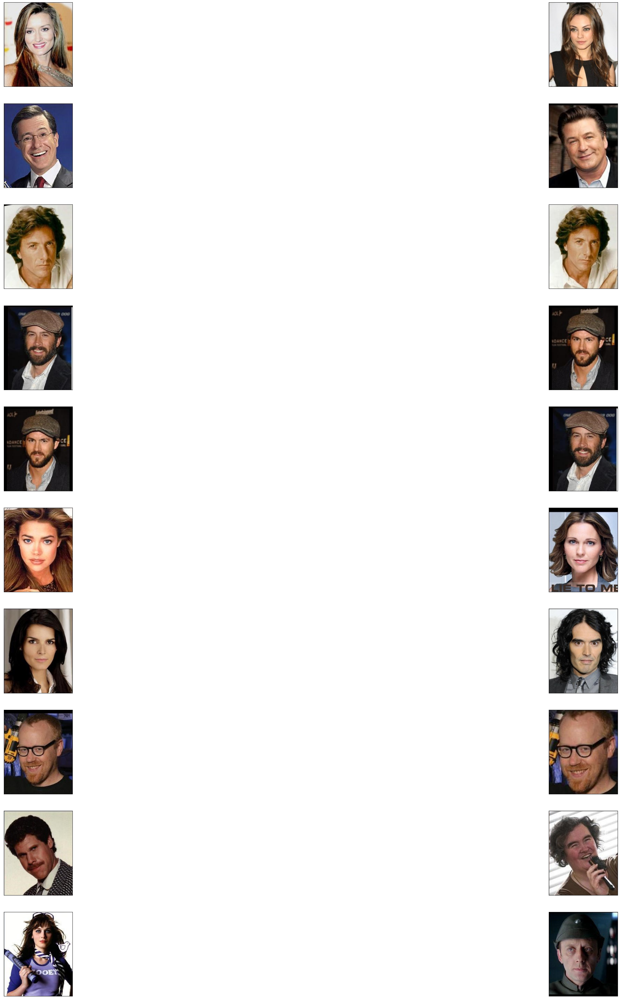

In [116]:
def visualize(b,k):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(50, 50))

    axs = fig.subplots(k, 2)
    for i in range(k):
        img1=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i]])
        img2=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i+1]])
        show(axs[i, 0], cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        show(axs[i, 1], cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        

#Cosine Similarity pairs
visualize(bI,10)

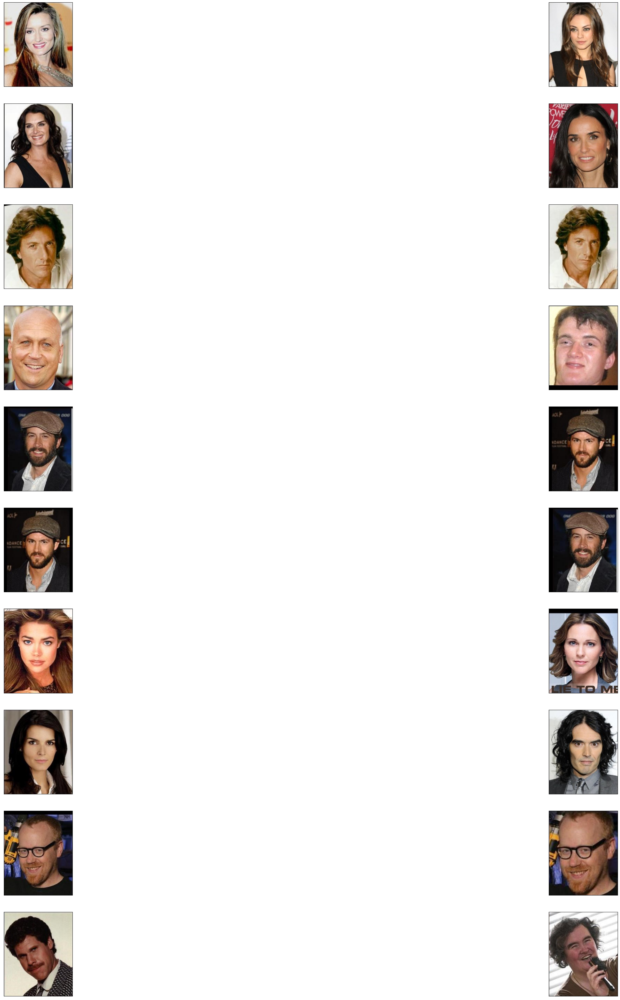

In [117]:
#Euclidean pairs
visualize(dI,10)

In [118]:
l=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]

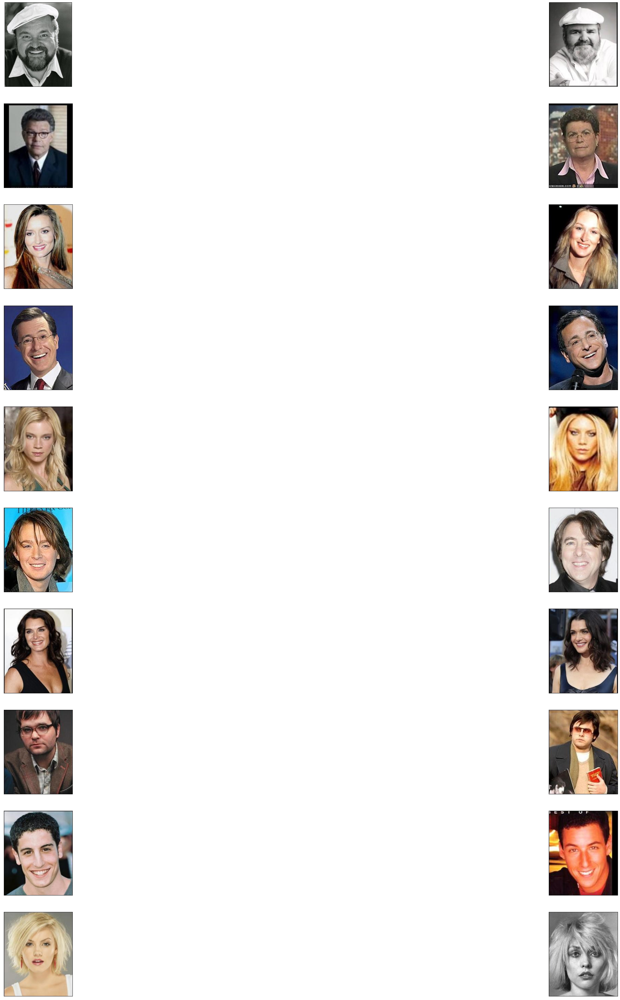

In [119]:
#pairs of the dataset
visualize(l,10)

# There are some occurences of the images for both measure but bear in mind that we  combine both folders and some images are present in both folders nontherless on the big picture they don't affect the results drastically.

# Euclidean distance seems to perform better with the Eigenfaces method unlike the face models and gives interesting pairs.